In [2]:
from huggingface_hub import interpreter_login

interpreter_login()  # same as before


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|



In [23]:
# Imports nécessaires (garder ceux du début de votre fichier)
import torch
import torch.nn.functional as F
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import os
from pathlib import Path
import copy
from typing import List, Optional, Tuple, Union, Dict

# Imports pour diffusers
from diffusers import StableDiffusionPipeline, DDIMScheduler, UNet2DConditionModel, AutoencoderKL
from diffusers.models.attention_processor import Attention
from transformers import CLIPTextModel, CLIPTokenizer, CLIPFeatureExtractor # S'assurer que tout est importé

# Pour l'optimisation d'embedding et le fine-tuning
import torch.optim as optim
import huggingface_hub # Pour gérer le token

# Définir l'appareil
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Utilisation de l'appareil: {device}")

# --- Classes AttentionStore et AttentionProcessor (Garder tel quel) ---
class AttentionStore:
    def __init__(self): self.store = {}
    def __call__(self, attn, is_cross: bool, place_in_unet: str):
        if is_cross:
            key = f"{place_in_unet}_cross"; self.store.setdefault(key, []).append(attn)
    def reset(self): self.store = {}
    def get_average_attention(self):
        return {k: torch.stack(v).mean(0) for k, v in self.store.items()}

class AttentionProcessor(nn.Module):
    def __init__(self, attn_store, place_in_unet):
        super().__init__()
        self.attn_store = attn_store
        self.place_in_unet = place_in_unet # Ajouter place_in_unet ici
    def __call__(self, attn: Attention, hidden_states, encoder_hidden_states=None, attention_mask=None):
        batch_size, sequence_length, _ = hidden_states.shape
        attention_mask = attn.prepare_attention_mask(attention_mask, sequence_length, batch_size)
        query = attn.to_q(hidden_states)
        is_cross = encoder_hidden_states is not None
        encoder_hidden_states = encoder_hidden_states if is_cross else hidden_states
        key = attn.to_k(encoder_hidden_states)
        value = attn.to_v(encoder_hidden_states)
        # --- Correction potentielle pour cross-attention norm ---
        # if attn.norm_cross and is_cross: # Vérifier si l'attribut existe
        #    encoder_hidden_states = attn.norm_encoder_hidden_states(encoder_hidden_states)
        # --- fin correction ---
        query = attn.head_to_batch_dim(query); key = attn.head_to_batch_dim(key); value = attn.head_to_batch_dim(value)
        attention_probs = attn.get_attention_scores(query, key, attention_mask)
        if is_cross and self.attn_store is not None:
            # Utiliser place_in_unet stocké
            self.attn_store(attention_probs.cpu(), is_cross, self.place_in_unet) # Envoyer sur CPU pour économiser VRAM ?
        hidden_states = torch.bmm(attention_probs, value)
        hidden_states = attn.batch_to_head_dim(hidden_states)
        hidden_states = attn.to_out[0](hidden_states); hidden_states = attn.to_out[1](hidden_states)
        return hidden_states

class ControlledAttentionProcessor(nn.Module):
    def __init__(self, tokenizer, target_prompt_tokens): # Besoin du tokenizer et des tokens cibles
        super().__init__()
        self.tokenizer = tokenizer
        self.target_prompt_tokens = target_prompt_tokens
        # Identifier les indices des tokens à modifier (ex: "party", "hat")
        # Ceci est SIMPLISTE, une meilleure méthode est nécessaire
        self.edit_token_indices = self._get_edit_token_indices(target_prompt_tokens)

    def _get_edit_token_indices(self, tokens):
        # Logique pour trouver les indices des mots ajoutés/modifiés
        # Exemple très basique:
        indices = []
        edit_words = ["party", "hat"] # À rendre dynamique
        for i, token_id in enumerate(tokens[0]): # Supposer batch size 1
            word = self.tokenizer.decode([token_id])
            if any(edit_word in word for edit_word in edit_words):
                 indices.append(i)
        return indices

    # __call__ doit être modifié pour accepter e_source et e_target
    # via cross_attention_kwargs ou une autre méthode
    def __call__(self, attn: Attention, hidden_states, encoder_hidden_states=None, attention_mask=None, **cross_attention_kwargs):
         # Récupérer e_source et e_target des kwargs
         e_source = cross_attention_kwargs.get("e_source")
         e_target = cross_attention_kwargs.get("e_target")
         if e_source is None or e_target is None:
              # Fallback: utiliser l'embedding passé normalement si un seul est fourni
              return # ... logique d'attention standard ...

         # --- Calculer Q, K, V pour source ET target ---
         query = attn.to_q(hidden_states)
         key_source = attn.to_k(e_source); value_source = attn.to_v(e_source)
         key_target = attn.to_k(e_target); value_target = attn.to_v(e_target)

         # Reshape pour les têtes
         query = attn.head_to_batch_dim(query)
         key_source = attn.head_to_batch_dim(key_source); value_source = attn.head_to_batch_dim(value_source)
         key_target = attn.head_to_batch_dim(key_target); value_target = attn.head_to_batch_dim(value_target)

         # Calculer les probas d'attention pour les deux
         attn_probs_source = attn.get_attention_scores(query, key_source, attention_mask)
         attn_probs_target = attn.get_attention_scores(query, key_target, attention_mask)

         # --- Injection/Modification ---
         attn_probs_modified = attn_probs_target.clone()
         # Pour tous les tokens SAUF ceux à éditer, copier depuis la source
         for k in range(attn_probs_target.shape[-1]): # Itérer sur les tokens K
             if k not in self.edit_token_indices:
                  attn_probs_modified[:, :, k] = attn_probs_source[:, :, k]

         # --- Calcul final avec value_target et attn_probs_modified ---
         hidden_states = torch.bmm(attn_probs_modified, value_target)
         hidden_states = attn.batch_to_head_dim(hidden_states)
         hidden_states = attn.to_out[0](hidden_states); hidden_states = attn.to_out[1](hidden_states)
         return hidden_states

# --- Classe principale Modifiée ---
class ImageEditingWithImagic:

    def __init__(self, model_id_or_path="stabilityai/stable-diffusion-v1-5", verbose=True, use_auth_token=None):
        self.model_id_or_path = model_id_or_path
        self.verbose = verbose
        self.attention_store = AttentionStore()

        # Configuration pour le chargement (commune aux deux méthodes)
        load_kwargs = {
            "torch_dtype": torch.float32,
            # Les safety checkers peuvent être lourds et sont souvent désactivés pour l'édition
            # Décommentez si vous les voulez absolument, mais ils peuvent nécessiter plus de VRAM/temps
            # "safety_checker": StableDiffusionSafetyChecker.from_pretrained("CompVis/stable-diffusion-safety-checker"),
            # "requires_safety_checker": True
        }

        # Gestion du token (optionnel, utile pour modèles privés/gated)
        token = None
        if use_auth_token is True:
            token = huggingface_hub.HfFolder.get_token()
        elif isinstance(use_auth_token, str):
            token = use_auth_token
        if token:
             load_kwargs["use_auth_token"] = token # Ajouté dynamiquement si un token est fourni

        if self.verbose:
            print(f"Tentative de chargement des composants pour '{self.model_id_or_path}'...")

        # --- PRIORITÉ AU CHARGEMENT DES COMPOSANTS ---
        try:
            # Charger les composants individuellement
            self.tokenizer = CLIPTokenizer.from_pretrained(self.model_id_or_path, subfolder="tokenizer", **load_kwargs)
            self.text_encoder = CLIPTextModel.from_pretrained(self.model_id_or_path, subfolder="text_encoder", **load_kwargs).to(device)
            self.vae = AutoencoderKL.from_pretrained(self.model_id_or_path, subfolder="vae", **load_kwargs).to(device)
            self.unet = UNet2DConditionModel.from_pretrained(self.model_id_or_path, subfolder="unet", **load_kwargs).to(device)
            self.scheduler = DDIMScheduler.from_pretrained(self.model_id_or_path, subfolder="scheduler") # Pas besoin de dtype ici

            # Feature extractor est optionnel et souvent non nécessaire si pas de safety checker
            try:
                self.feature_extractor = CLIPFeatureExtractor.from_pretrained(self.model_id_or_path, subfolder="feature_extractor", **load_kwargs)
            except Exception:
                if self.verbose:
                    print("Feature extractor non trouvé ou non nécessaire, initialisation à None.")
                self.feature_extractor = None

            # Mettre les modèles en mode évaluation par défaut
            self.vae.eval()
            self.text_encoder.eval()
            self.unet.eval()

            if self.verbose:
                print("Composants chargés avec succès!")

        except Exception as component_error:
            if self.verbose:
                print(f"\nERREUR lors du chargement des composants: {str(component_error)}")
                print("Causes possibles: chemin local incorrect, ID Hugging Face invalide, problème réseau, cache corrompu.")
                print("-> Vérifiez le chemin/ID: ", self.model_id_or_path)
                print("-> Vérifiez la connexion réseau / pare-feu / VPN.")
                print("-> Essayez de supprimer le cache: rm -rf ~/.cache/huggingface")
                print("-> Si chemin local, vérifiez qu'il contient les sous-dossiers: tokenizer, text_encoder, vae, unet, scheduler")
            raise component_error # Relancer l'erreur après les messages d'aide


    def register_attention_control(self):
        """
        Enregistre le processeur d'attention personnalisé UNIQUEMENT pour les couches de cross-attention.
        """
        attn_procs = {}
        num_registered = 0
        try:
            for name, module in self.unet.named_modules():
                # Cibler spécifiquement les modules d'attention qui sont probablement de la cross-attention
                # dans l'architecture SDv1/v2 (souvent nommés 'attn2')
                if "attn2" in name and isinstance(module, Attention):
                    # Créer une instance de processeur pour CETTE couche spécifique
                    # Lui passer son nom pour le stockage
                    processor_instance = AttentionProcessor(self.attention_store, name)
                    # Assigner directement à l'attribut 'processor' du module
                    # C'est souvent plus compatible entre versions que set_attn_processor global
                    module.processor = processor_instance
                    num_registered += 1

            if self.verbose:
                if num_registered > 0:
                    print(f"Processeurs d'attention enregistrés pour {num_registered} couches de cross-attention via assignation directe.")
                else:
                    print("AVERTISSEMENT: Aucune couche de cross-attention ('attn2') trouvée pour enregistrer les processeurs.")

        except Exception as e:
            if self.verbose:
                print(f"Erreur lors de l'assignation directe des processeurs d'attention: {e}")
                print("La capture d'attention pourrait ne pas fonctionner.")

    # --- Garder les méthodes preprocess_image, encode_image_to_latent, encode_text ---
    # --- Garder les méthodes step_a, step_b, step_c (vérifier les dtypes à l'intérieur si float16 est utilisé) ---
    # --- Garder visualize_attention_maps et edit_image ---
    # ... (Collez ici les méthodes inchangées de votre code original) ...
    # --- Assurez-vous que les appels à self.pipe.* sont remplacés par self.vae.*, self.unet.* etc. ---
    # Exemple de correction dans step_a:
    # noisy_latent = self.scheduler.add_noise(...) au lieu de self.pipe.scheduler...
    # noise_pred = self.unet(...) au lieu de self.pipe.unet...
    # Pareil dans step_c etc. J'ai mis à jour step_a et step_c ci-dessous. step_b utilise déjà self.unet

    def preprocess_image(self, image, target_size=512):
        if isinstance(image, str): image = Image.open(image).convert("RGB")
        if image.width != target_size or image.height != target_size: image = image.resize((target_size, target_size), Image.LANCZOS)
        image = np.array(image).astype(np.float32) / 255.0
        image = torch.from_numpy(image).permute(2, 0, 1)
        image = 2.0 * image - 1.0
        image = image.unsqueeze(0).to(device=device, dtype=self.vae.dtype)
        return image

    def encode_image_to_latent(self, image):
        with torch.no_grad(): latent = self.vae.encode(image).latent_dist.sample() * self.vae.config.scaling_factor
        return latent

    def encode_text(self, text):
        text_input = self.tokenizer(text, padding="max_length", max_length=self.tokenizer.model_max_length, truncation=True, return_tensors="pt")
        with torch.no_grad(): text_embedding = self.text_encoder(text_input.input_ids.to(device))[0]
        return text_embedding.to(dtype=self.text_encoder.dtype) # Assurer le bon dtype

    def step_a_optimize_text_embedding(self, input_image, target_text, num_steps=100, lr=1e-3):
        if self.verbose: print(f"\n--- Étape A: Optimisation de l'embedding pour '{target_text}' ---")
        if isinstance(input_image, torch.Tensor): preprocessed_image = input_image # Assume already preprocessed if tensor
        else: preprocessed_image = self.preprocess_image(input_image)
        latent_input = self.encode_image_to_latent(preprocessed_image)
        target_embedding = self.encode_text(target_text)
        optimizable_embedding = target_embedding.clone().detach().requires_grad_(True)
        optimizer = optim.Adam([optimizable_embedding], lr=lr)
        self.vae.requires_grad_(False); self.text_encoder.requires_grad_(False); self.unet.requires_grad_(False)
        pbar = tqdm(range(num_steps), desc="Optimisation embedding")
        for step in pbar:
            optimizer.zero_grad()
            t = torch.randint(0, self.scheduler.config.num_train_timesteps, (1,), device=device).long()
            noise = torch.randn_like(latent_input)
            # Utiliser self.scheduler directement
            noisy_latent = self.scheduler.add_noise(latent_input.to(noise.dtype), noise, t) # Assurer compatibilité dtype
            noise_pred = self.unet(noisy_latent, t, encoder_hidden_states=optimizable_embedding.to(self.unet.dtype)).sample
            loss = F.mse_loss(noise_pred.float(), noise.float())
            loss.backward();
            torch.nn.utils.clip_grad_norm_(optimizable_embedding, 1.0)
            optimizer.step()
            pbar.set_description(f"Optimisation embedding - Loss: {loss.item():.4f}")
        optimized_embedding = optimizable_embedding.clone().detach()
        if self.verbose: print(f"--- Fin Étape A ---")
        return optimized_embedding, latent_input, target_embedding

    def step_b_finetune_unet(self, latent_input, optimized_embedding, num_steps=200, lr=5e-7):
        if self.verbose: print("\n--- Étape B: Fine-tuning de l'UNet ---")
        self.unet.requires_grad_(True); self.text_encoder.requires_grad_(False); self.vae.requires_grad_(False)
        optimizer = optim.Adam(self.unet.parameters(), lr=lr) # Optimiser seulement UNet
        self.unet.train() # Mettre en mode train
        pbar = tqdm(range(num_steps), desc="Fine-tuning UNet")
        for step in pbar:
            optimizer.zero_grad()
            t = torch.randint(0, self.scheduler.config.num_train_timesteps, (1,), device=device).long()
            noise = torch.randn_like(latent_input)
            noisy_latent = self.scheduler.add_noise(latent_input.to(noise.dtype), noise, t)
            noise_pred = self.unet(noisy_latent, t, encoder_hidden_states=optimized_embedding.to(self.unet.dtype)).sample
            loss = F.mse_loss(noise_pred.float(), noise.float())
            loss.backward();
            torch.nn.utils.clip_grad_norm_(self.unet.parameters(), 1.0)
            optimizer.step()
            pbar.set_description(f"Fine-tuning UNet - Loss: {loss.item():.4f}")
        self.unet.eval() # Remettre en mode eval
        if self.verbose: print("--- Fin Étape B ---")
        return self.unet # Retourner le UNet fine-tuné (même si modifié en place)

    def step_c_generate_with_attention_control(self, target_embedding, optimized_embedding,
                                           eta=0.7, guidance_scale=7.5, num_inference_steps=50,
                                           height=512, width=512, generator=None): # Ajouter generator pour reproductibilité
        if self.verbose: print("\n--- Étape C: Génération ---")
        interpolated_embedding = eta * target_embedding.to(optimized_embedding.dtype) + (1 - eta) * optimized_embedding
        self.register_attention_control(); self.attention_store.reset()
        uncond_input = self.tokenizer([""] * 1, padding="max_length", max_length=self.tokenizer.model_max_length, truncation=True, return_tensors="pt")
        with torch.no_grad(): uncond_embeddings = self.text_encoder(uncond_input.input_ids.to(device))[0].to(self.unet.dtype)
        text_embeddings = torch.cat([uncond_embeddings, interpolated_embedding])
        latents = torch.randn((1, self.unet.config.in_channels, height // 8, width // 8), generator=generator, device=device, dtype=self.unet.dtype) # Utiliser generator
        # Utiliser self.scheduler directement
        self.scheduler.set_timesteps(num_inference_steps)
        latents = latents * self.scheduler.init_noise_sigma # Utiliser le scheduler chargé
        pbar_c = tqdm(self.scheduler.timesteps, desc="Génération")
        for i, t in enumerate(pbar_c):
            latent_model_input = torch.cat([latents] * 2)
            latent_model_input = self.scheduler.scale_model_input(latent_model_input, timestep=t)
            with torch.no_grad(): noise_pred = self.unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample
            noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
            noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
            latents = self.scheduler.step(noise_pred, t, latents).prev_sample
        latents = 1 / self.vae.config.scaling_factor * latents # Utiliser le VAE chargé
        with torch.no_grad(): image = self.vae.decode(latents.to(self.vae.dtype)).sample
        image = (image / 2 + 0.5).clamp(0, 1).cpu().permute(0, 2, 3, 1).float().numpy()[0] # Utiliser float() avant numpy
        final_image = Image.fromarray((image * 255).round().astype("uint8"))
        if self.verbose: print("--- Fin Étape C ---")
        attention_maps = self.attention_store.get_average_attention()
        return final_image, attention_maps

    def visualize_attention_maps(self, original_image, generated_image, attention_maps, num_token_maps=4, sequence_length=77): # Ajouter sequence_length
        """
        Visualise les cartes d'attention pour comprendre le processus d'édition
        """
        if not attention_maps:
             if self.verbose: print("Aucune carte d'attention à visualiser.")
             return None

        # Essayer de trouver une carte de cross-attention pertinente des couches supérieures/milieu
        key_to_show = None
        possible_keys = sorted([k for k in attention_maps if 'cross' in k and ('up_blocks.1' in k or 'up_blocks.2' in k or 'mid_block' in k)]) # Prioriser up/mid blocks
        if not possible_keys:
             possible_keys = sorted(list(attention_maps.keys())) # Prendre n'importe laquelle si pas de cross pertinente trouvée
        if possible_keys:
            key_to_show = possible_keys[-1] # Prendre une des dernières couches trouvées
        else:
             if self.verbose: print("Aucune clé de carte d'attention trouvée.")
             return None

        # Récupérer la carte moyenne (sur les étapes de diffusion) pour cette couche
        # La forme devrait être [Heads, Q, K] après mean(0) dans get_average
        attn_map_step_avg = attention_maps[key_to_show]

        # Vérifier la forme attendue [Heads, QueryLength, KeyLength]
        if attn_map_step_avg.ndim != 3:
             if self.verbose: print(f"Forme inattendue pour attn_map_step_avg ('{key_to_show}'): {attn_map_step_avg.shape}. Attendu 3 dimensions.")
             return None

        num_heads, query_len, key_len = attn_map_step_avg.shape

        # Vérifier si la longueur de clé correspond à la longueur de séquence attendue
        if key_len != sequence_length:
            if self.verbose:
                print(f"Attention ('{key_to_show}'): La longueur de clé ({key_len}) ne correspond pas à sequence_length ({sequence_length}). La visualisation des tokens pourrait être incorrecte.")
            # Ajuster sequence_length pour correspondre à la carte réelle si nécessaire pour la boucle
            sequence_length = key_len

        # Essayer de deviner la résolution spatiale Q = H*W
        resolution_squared = query_len
        resolution = int(np.sqrt(resolution_squared))
        if resolution * resolution != resolution_squared:
            if self.verbose: print(f"Impossible de déterminer la résolution spatiale pour '{key_to_show}' à partir de query_len={query_len}.")
            # Essayer une résolution commune si la clé le suggère (ex: mid_block -> 8*8?) - logique plus complexe nécessaire
            # Pour l'instant, on abandonne si la résolution n'est pas carrée.
            # Les couches d'attention dans SD ont généralement des résolutions spatiales carrées (64x64, 32x32, 16x16, 8x8)
            print(f"-> Tentative avec résolution 64 (pour 4096), 32 (pour 1024), 16 (pour 256), 8 (pour 64)")
            possible_res = {64: 4096, 32: 1024, 16: 256, 8: 64}
            found_res = False
            for res_guess, q_len_guess in possible_res.items():
                 if query_len == q_len_guess:
                      resolution = res_guess
                      found_res = True
                      print(f"-> Résolution spatiale déduite : {resolution}x{resolution}")
                      break
            if not found_res:
                 print("-> Échec de la déduction de la résolution spatiale.")
                 return None # Abandonner si on ne trouve pas

        if self.verbose: print(f"Visualisation de l'attention pour {key_to_show}, résolution {resolution}x{resolution}, {key_len} tokens.")

        # --- Option A: Attention Spatiale Moyenne (Reçue) ---
        # Moyenne sur les têtes ET les tokens texte (dimension K)
        # Forme résultante: [Q] qui peut être reshapée en [H, W]
        try:
            attn_spatial_avg = attn_map_step_avg.mean(dim=(0, 2)).reshape(resolution, resolution).cpu().numpy()
        except Exception as e:
            print(f"Erreur lors du calcul/reshape de l'attention spatiale moyenne: {e}")
            attn_spatial_avg = np.zeros((resolution, resolution)) # Placeholder en cas d'erreur

        # --- Option B: Attention pour des Tokens Spécifiques (Donnée) ---
        # Moyenne sur les têtes (dimension 0) -> [Q, K]
        try:
            attn_head_avg = attn_map_step_avg.mean(dim=0) # Shape: [Q, K]
        except Exception as e:
            print(f"Erreur lors de la moyenne sur les têtes: {e}")
            attn_head_avg = torch.zeros((query_len, key_len)) # Placeholder

        # Nombre de cartes de tokens à afficher
        num_token_maps_to_show = min(num_token_maps, sequence_length)

        # Créer la figure
        # +1 pour l'image originale, +1 pour l'éditée, +1 pour la spatiale moyenne, +N pour les tokens
        fig, axs = plt.subplots(1, 3 + num_token_maps_to_show, figsize=(18, 4)) # Ajuster figsize si besoin
        axs = axs.flatten() # Assurer que axs est toujours indexable

        # Afficher les images
        axs[0].imshow(original_image); axs[0].set_title("Originale"); axs[0].axis("off")
        axs[1].imshow(generated_image); axs[1].set_title("Éditée"); axs[1].axis("off")

        # Afficher la carte d'activation spatiale moyenne
        im_spatial = axs[2].imshow(attn_spatial_avg, cmap='viridis'); axs[2].set_title("Attn Spatiale Moyenne"); axs[2].axis("off")
        # fig.colorbar(im_spatial, ax=axs[2], shrink=0.6) # Optionnel

        # Afficher les cartes par token
        for i in range(num_token_maps_to_show):
             token_idx = i # Afficher les premiers tokens (0: <bos>, 1: premier mot, ...)
             try:
                 # Sélectionner le token, reshaper la dimension spatiale Q en HxW
                 attn_token = attn_head_avg[:, token_idx].reshape(resolution, resolution).cpu().numpy()
             except Exception as e:
                 print(f"Erreur lors du reshape pour token {token_idx}: {e}")
                 attn_token = np.zeros((resolution, resolution)) # Placeholder

             ax_idx = 3 + i
             if ax_idx < len(axs): # Vérifier si l'axe existe
                 im_token = axs[ax_idx].imshow(attn_token, cmap='viridis'); axs[ax_idx].set_title(f"Token {token_idx}"); axs[ax_idx].axis("off")
                 # fig.colorbar(im_token, ax=axs[ax_idx], shrink=0.6) # Optionnel

        # Cacher les axes restants si moins de cartes sont affichées que prévu
        for j in range(3 + num_token_maps_to_show, len(axs)):
             axs[j].axis("off")

        plt.tight_layout(); plt.show()
        return fig


    def edit_image(self, input_image, target_text,
                  steps_a=100, lr_a=1e-3,
                  steps_b=200, lr_b=5e-7,
                  eta=0.7, guidance_scale=7.5, inference_steps=50):
        # --- Garder cette méthode telle quelle, elle appelle les autres ---
        # ... (elle utilise déjà les méthodes corrigées A, B, C)
        if isinstance(input_image, str): input_image_pil = Image.open(input_image).convert("RGB")
        elif isinstance(input_image, Image.Image): input_image_pil = input_image
        else: # Si c'est un tenseur, essayer de le décoder pour la visualisation
             try:
                 with torch.no_grad():
                     latents = self.vae.encode(input_image).latent_dist.mean # Utiliser la moyenne pour une reconstruction stable
                     latents = 1 / self.vae.config.scaling_factor * latents
                     rec_image = self.vae.decode(latents.to(self.vae.dtype)).sample
                     rec_image = (rec_image / 2 + 0.5).clamp(0, 1).cpu().permute(0, 2, 3, 1).float().numpy()[0]
                     input_image_pil = Image.fromarray((rec_image * 255).round().astype("uint8"))
             except Exception as e:
                 if self.verbose: print(f"Impossible de décoder le tenseur d'entrée pour la visualisation : {e}")
                 input_image_pil = Image.new('RGB', (512, 512), color = 'grey') # Placeholder

        optimized_embedding, latent_input, target_embedding = self.step_a_optimize_text_embedding(
            input_image_pil, target_text, num_steps=steps_a, lr=lr_a # Passer PIL pour être sûr
        )
        _ = self.step_b_finetune_unet( # Pas besoin de stocker le retour, UNet est modifié en place
            latent_input, optimized_embedding, num_steps=steps_b, lr=lr_b
        )
        generated_image, attention_maps = self.step_c_generate_with_attention_control(
            target_embedding, optimized_embedding, eta=eta, guidance_scale=guidance_scale, num_inference_steps=inference_steps
        )
        fig = self.visualize_attention_maps(input_image_pil, generated_image, attention_maps)
        os.makedirs("./output", exist_ok=True); generated_image.save("./output/edited_image.png")
        if fig: fig.savefig("./output/attention_visualization.png")
        return {"original_image": input_image_pil, "edited_image": generated_image, "attention_maps": attention_maps,
                "optimized_embedding": optimized_embedding, "target_embedding": target_embedding, "figure": fig}

    def register_controlled_attention(self, target_text): # Passer le texte cible
        attn_procs = {}
        # Encoder les tokens une fois pour le processeur
        tokens_pt = self.tokenizer(target_text, padding="max_length", max_length=self.tokenizer.model_max_length, truncation=True, return_tensors="pt")
        target_tokens = tokens_pt.input_ids

        for name, module in self.unet.named_modules():
            if "attn2" in name and isinstance(module, Attention):
                 # Donner le tokenizer et les tokens au processeur
                 processor_instance = ControlledAttentionProcessor(self.tokenizer, target_tokens)
                 module.processor = processor_instance
        if self.verbose: print("Processeurs d'attention contrôlée enregistrés.")


    # --- DANS step_c_generate_with_attention_control ---
        # ... (début inchangé jusqu'à la préparation des embeddings)

        # Activer le contrôle d'attention (passer le texte cible)
        self.register_controlled_attention(target_text) # Assurez-vous que target_text est disponible ici

        # ... (préparation uncond_embeddings)

        # NE PAS interpoler ici si le contrôle d'attention gère tout
        # text_embeddings = torch.cat([uncond_embeddings, target_embedding]) # Utiliser e_tgt directement ? Ou e_bar ? À tester.
        # Pour CFG, il faut quand même l'embedding cible
        e_target_for_cfg = interpolated_embedding # Ou juste target_embedding ?
        text_embeddings_cfg = torch.cat([uncond_embeddings, e_target_for_cfg])

        # ... (initialisation latents_inf)

        for i, t in enumerate(tqdm(self.scheduler.timesteps, desc="Génération Contrôlée")):
            latent_model_input = torch.cat([latents_inf] * 2)
            latent_model_input = self.scheduler.scale_model_input(latent_model_input, timestep=t)

            # Préparer les kwargs pour le processeur d'attention
            # Le processeur utilisera e_opt_optimized (source) et l'embedding cible fourni ici
            cross_attention_kwargs = {"e_source": e_opt_optimized, "e_target": e_target_for_cfg}

            with torch.no_grad():
                 noise_pred = self.unet(
                     latent_model_input,
                     t,
                     encoder_hidden_states=text_embeddings_cfg, # L'embedding pour CFG
                     cross_attention_kwargs=cross_attention_kwargs # Passer les embeddings source/cible au processeur
                 ).sample

            # ... (reste de CFG et step) ...

        # --- DÉSENGAGER les processeurs après la génération ---
        self.unet.set_attn_processor(None) # Ou réassigner les processeurs par défaut

        # ... (décodage image) ...
        return final_image, {} # Plus besoin de retourner les cartes d'attention ici, elles sont utilisées en interne
# --- Classe ImageSequenceGenerator (Garder telle quelle, mais corriger l'appel super) ---
class ImageSequenceGenerator(ImageEditingWithImagic):
    # Correction: Passer le model_id à la classe parente
    def __init__(self, model_id_or_path="stabilityai/stable-diffusion-v1-5", verbose=True, use_auth_token=None):
        super().__init__(model_id_or_path=model_id_or_path, verbose=verbose, use_auth_token=use_auth_token)

    def generate_sequence(self, input_image, target_text, num_frames=8,
                          start_eta=0.1, end_eta=0.9,
                          steps_a=100, lr_a=1e-3, # Passer les kwargs aux étapes internes
                          steps_b=200, lr_b=5e-6,
                          guidance_scale=7.5, inference_steps=50):
        if self.verbose: print(f"\n--- Génération d'une séquence de {num_frames} images ---")
        # S'assurer que l'image est PIL pour step_a
        if isinstance(input_image, str): input_image_pil = Image.open(input_image).convert("RGB")
        elif isinstance(input_image, Image.Image): input_image_pil = input_image
        else: # Tenseur ? Essayer de décoder ou lever une erreur
             raise TypeError("generate_sequence attend un chemin d'image ou un objet PIL.Image")

        # Étapes A et B (exécutées une fois)
        optimized_embedding, latent_input, target_embedding = self.step_a_optimize_text_embedding(
            input_image_pil, target_text, num_steps=steps_a, lr=lr_a
        )
        _ = self.step_b_finetune_unet(
            latent_input, optimized_embedding, num_steps=steps_b, lr=lr_b
        )
        # Générer les frames
        eta_values = np.linspace(start_eta, end_eta, num_frames)
        sequence = []
        for i, eta in enumerate(tqdm(eta_values, desc="Génération de séquence")):
            if self.verbose: print(f"Frame {i+1}/{num_frames}, eta={eta:.2f}")
            # Passer les bons kwargs à step_c
            image, _ = self.step_c_generate_with_attention_control(
                target_embedding, optimized_embedding, eta=eta,
                guidance_scale=guidance_scale, num_inference_steps=inference_steps
            )
            sequence.append(image)
        # Sauvegarder et visualiser
        os.makedirs("./output", exist_ok=True)
        if sequence:
             try:
                  # Utiliser imageio pour une meilleure compatibilité GIF
                  import imageio
                  imageio.mimsave('./output/sequence.gif', [np.array(img) for img in sequence], duration=0.2, loop=0) # loop=0 pour boucle infinie
                  print("GIF sauvegardé dans ./output/sequence.gif")
             except ImportError:
                  print("Le paquet 'imageio' n'est pas installé. Sauvegarde GIF annulée. Installez avec 'pip install imageio'")
             except Exception as e:
                  print(f"Erreur lors de la sauvegarde du GIF : {e}")
        # Visualisation
        if sequence:
             cols = min(len(sequence), 8) # Afficher max 8 frames en ligne
             rows = (len(sequence) - 1) // cols + 1
             fig, axs = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
             axs = axs.flatten()
             for i, img in enumerate(sequence):
                 axs[i].imshow(img); axs[i].set_title(f"eta={eta_values[i]:.2f}"); axs[i].axis("off")
             for j in range(i + 1, len(axs)): axs[j].axis("off") # Cacher les axes vides
             plt.tight_layout(); plt.show()
             if fig: fig.savefig("./output/sequence_visualization.png")
        return sequence

"""
# --- Exemple d'utilisation Corrigé ---
if __name__ == "__main__":
    # --- MODIFIER CE CHEMIN avec votre image ---
    INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
    if not os.path.exists(INPUT_IMAGE_PATH):
         print(f"ERREUR: Le fichier image '{INPUT_IMAGE_PATH}' n'existe pas. Veuillez modifier le chemin.")
         # Mettre une image placeholder pour éviter de planter si on veut tester le code
         INPUT_IMAGE_PATH = Image.new('RGB', (512, 512), color = 'gray') # Ou raise FileNotFoundError
         print("Utilisation d'une image grise placeholder.")

    # --- MODIFIER CE PROMPT pour correspondre à votre image et édition ---
    TARGET_TEXT = "A dog with a blue hat"

    # --- CHOISIR LE MODÈLE (ID Hugging Face ou chemin local) ---
    # Utiliser SD 1.5 est recommandé pour commencer avec Imagic/Prompt-to-Prompt
    MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
    # Si vous avez téléchargé localement :
    # MODEL_ID_OR_PATH = "/chemin/absolu/vers/votre/dossier/stable-diffusion-v1-5"

    print("\n--- Initialisation pour Édition Simple ---")
    try:
        # Créer l'instance en utilisant l'ID/chemin choisi
        imagic_editor = ImageEditingWithImagic(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)

        print("\n--- Démarrage de l'édition ---")
        results = imagic_editor.edit_image(
            input_image=INPUT_IMAGE_PATH, # Passer le chemin ou l'objet PIL
            target_text=TARGET_TEXT,
            steps_a=100,    # Nombre d'étapes pour optimiser l'embedding
            lr_a=1e-3,      # Taux d'apprentissage pour l'embedding
            steps_b=150,    # Nombre d'étapes pour fine-tuner UNet (ajuster selon ressources)
            lr_b=5e-7,      # Taux d'apprentissage pour UNet (très petit)
            eta=0.7,        # Poids de l'embedding cible dans l'interpolation
            guidance_scale=7.5, # Force de la guidance CFG
            inference_steps=50  # Nombre d'étapes pour générer l'image finale
        )
        print("\n--- Édition simple terminée ---")
        # results["edited_image"].show() # Afficher l'image finale

    except Exception as e:
        print(f"\n!!! ERREUR lors de l'édition simple: {e} !!!")
        import traceback
        traceback.print_exc() # Afficher la trace complète pour le débogage


"""


    # --- Test de la génération de séquence (optionnel) ---
    # print("\n--- Initialisation pour Génération de Séquence ---")
    # try:
    #     # Vous pouvez utiliser le même modèle ou un autre
    #     seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    #
    #     print("\n--- Démarrage de la génération de séquence ---")
    #     sequence_images = seq_gen.generate_sequence(
    #         input_image=INPUT_IMAGE_PATH,
    #         target_text=TARGET_TEXT,
    #         num_frames=5,     # Nombre d'images dans le GIF/séquence
    #         start_eta=0.3,    # eta de départ pour l'interpolation
    #         end_eta=0.9,      # eta de fin
    #         steps_a=50,       # Peut-être réduire pour accélérer la séquence
    #         steps_b=100,      # Peut-être réduire pour accélérer la séquence
    #         inference_steps=30 # Peut-être réduire pour accélérer la séquence
    #     )
    #     print("\n--- Génération de séquence terminée ---")
    #
    # except Exception as e:
    #     print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
    #     import traceback
    #     traceback.print_exc()

Utilisation de l'appareil: cuda


'\n# --- Exemple d\'utilisation Corrigé ---\nif __name__ == "__main__":\n    # --- MODIFIER CE CHEMIN avec votre image ---\n    INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"\n    if not os.path.exists(INPUT_IMAGE_PATH):\n         print(f"ERREUR: Le fichier image \'{INPUT_IMAGE_PATH}\' n\'existe pas. Veuillez modifier le chemin.")\n         # Mettre une image placeholder pour éviter de planter si on veut tester le code\n         INPUT_IMAGE_PATH = Image.new(\'RGB\', (512, 512), color = \'gray\') # Ou raise FileNotFoundError\n         print("Utilisation d\'une image grise placeholder.")\n\n    # --- MODIFIER CE PROMPT pour correspondre à votre image et édition ---\n    TARGET_TEXT = "A dog with a blue hat"\n\n    # --- CHOISIR LE MODÈLE (ID Hugging Face ou chemin local) ---\n    # Utiliser SD 1.5 est recommandé pour commencer avec Imagic/Prompt-to-Prompt\n    MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"\n    # Si vous avez téléchargé localement :\n  

In [ ]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---



--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.1160: 100%|██████████| 25/25 [00:44<00:00,  1.78s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.2043: 100%|██████████| 50/50 [04:45<00:00,  5.70s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:40<00:00,  2.73s/it]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:50<03:20, 50.02s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:40<00:00,  2.71s/it]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [01:40<02:30, 50.13s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:40<00:00,  2.72s/it]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [02:30<01:40, 50.14s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:40<00:00,  2.71s/it]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [03:20<00:50, 50.13s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:40<00:00,  2.72s/it]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [04:10<00:00, 50.13s/it]


GIF sauvegardé dans ./output/sequence.gif


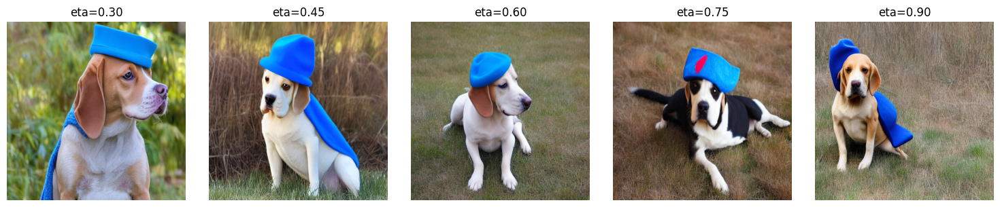


--- Génération de séquence terminée ---


In [3]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.0516: 100%|██████████| 25/25 [00:50<00:00,  2.03s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0113: 100%|██████████| 50/50 [03:58<00:00,  4.77s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:14<00:00,  1.04it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:22<01:30, 22.69s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:45<01:07, 22.53s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [01:07<00:44, 22.43s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:29<00:22, 22.44s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:14<00:00,  1.07it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:52<00:00, 22.43s/it]


GIF sauvegardé dans ./output/sequence.gif


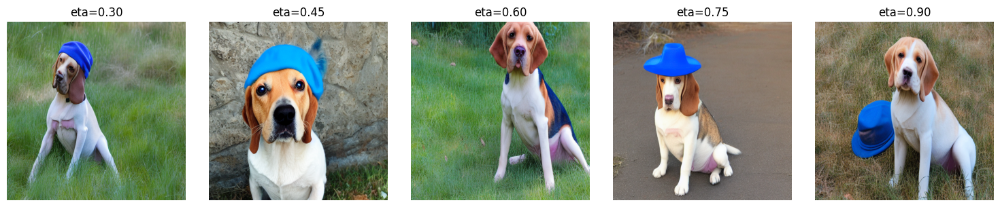


--- Génération de séquence terminée ---


In [4]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.0048: 100%|██████████| 25/25 [00:46<00:00,  1.86s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0604: 100%|██████████| 50/50 [05:10<00:00,  6.21s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:29<00:00,  1.99s/it]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:38<02:35, 38.96s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:29<00:00,  1.98s/it]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [01:17<01:56, 38.88s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:29<00:00,  1.98s/it]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [01:56<01:17, 38.85s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:29<00:00,  1.98s/it]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [02:35<00:38, 38.83s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:29<00:00,  1.98s/it]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [03:14<00:00, 38.84s/it]


GIF sauvegardé dans ./output/sequence.gif


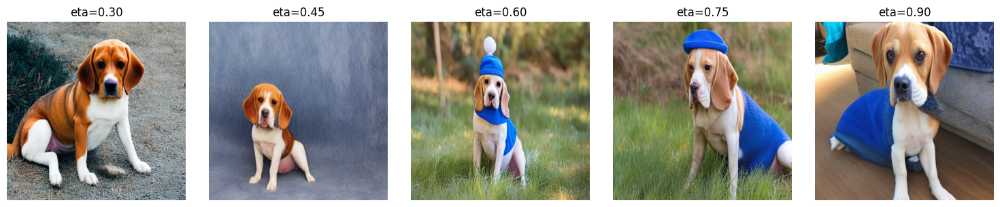


--- Génération de séquence terminée ---


In [5]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.4268: 100%|██████████| 25/25 [00:37<00:00,  1.51s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.2766: 100%|██████████| 50/50 [03:34<00:00,  4.28s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:18<00:00,  1.20s/it]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:27<01:51, 27.77s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:17<00:00,  1.19s/it]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:55<01:22, 27.66s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:17<00:00,  1.19s/it]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [01:22<00:55, 27.63s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:17<00:00,  1.20s/it]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:50<00:27, 27.64s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:18<00:00,  1.20s/it]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [02:18<00:00, 27.69s/it]


GIF sauvegardé dans ./output/sequence.gif


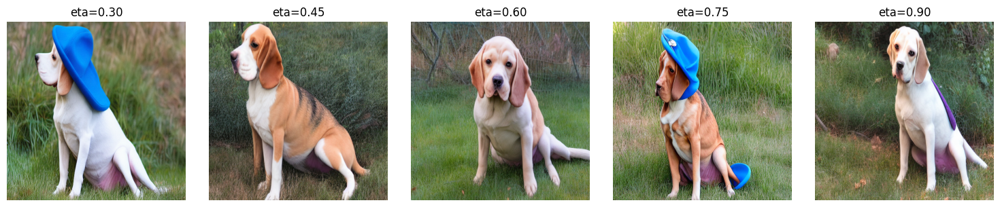


--- Génération de séquence terminée ---


In [6]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.2594: 100%|██████████| 25/25 [00:51<00:00,  2.05s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.8313: 100%|██████████| 50/50 [03:38<00:00,  4.38s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:34<00:00,  2.28s/it]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:41<02:47, 41.87s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:34<00:00,  2.29s/it]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [01:23<02:05, 41.90s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:34<00:00,  2.29s/it]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [02:05<01:23, 41.90s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:34<00:00,  2.29s/it]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [02:47<00:41, 41.93s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:34<00:00,  2.28s/it]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [03:29<00:00, 41.91s/it]


GIF sauvegardé dans ./output/sequence.gif


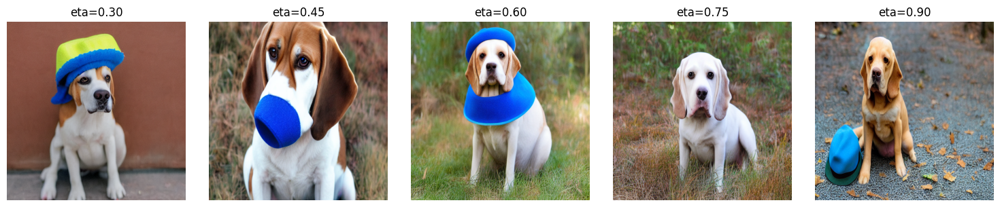


--- Génération de séquence terminée ---


In [7]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.3114: 100%|██████████| 25/25 [00:30<00:00,  1.22s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0067: 100%|██████████| 50/50 [03:40<00:00,  4.41s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.45it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:18<01:12, 18.14s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.46it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:36<00:54, 18.16s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.47it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:54<00:36, 18.10s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.45it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:12<00:18, 18.16s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.46it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:30<00:00, 18.16s/it]


GIF sauvegardé dans ./output/sequence.gif


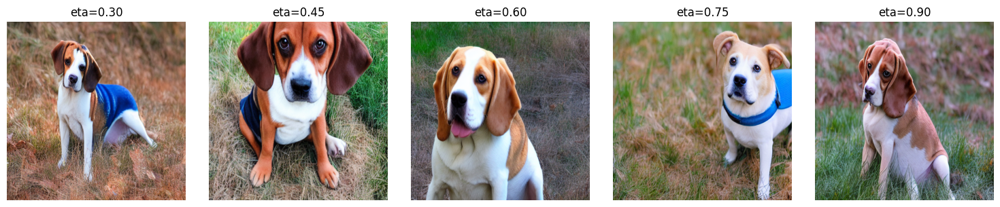


--- Génération de séquence terminée ---


In [8]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.0561: 100%|██████████| 25/25 [00:52<00:00,  2.12s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.4718: 100%|██████████| 50/50 [03:37<00:00,  4.34s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:23<01:32, 23.23s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:46<01:09, 23.13s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [01:09<00:46, 23.08s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:14<00:00,  1.03it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:32<00:23, 23.15s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:14<00:00,  1.02it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:55<00:00, 23.14s/it]


GIF sauvegardé dans ./output/sequence.gif


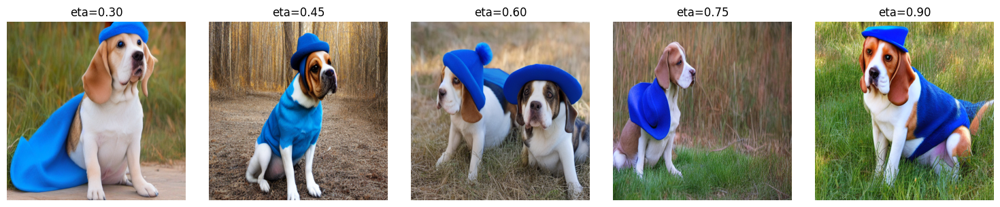


--- Génération de séquence terminée ---


In [9]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.0131: 100%|██████████| 25/25 [00:28<00:00,  1.14s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0626: 100%|██████████| 50/50 [03:34<00:00,  4.29s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:15<00:00,  1.06s/it]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:23<01:33, 23.39s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:46<01:09, 23.14s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:15<00:00,  1.02s/it]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [01:09<00:46, 23.02s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:15<00:00,  1.02s/it]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:32<00:23, 23.01s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:15<00:00,  1.03s/it]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:55<00:00, 23.00s/it]


GIF sauvegardé dans ./output/sequence.gif


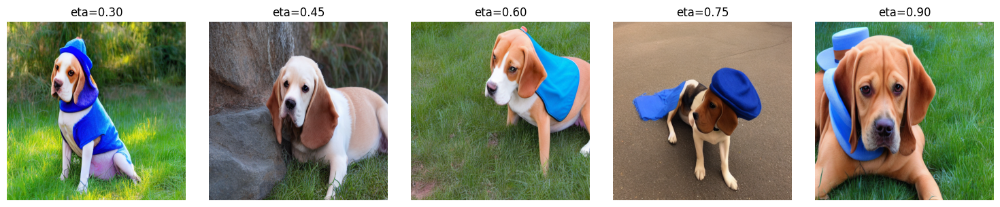


--- Génération de séquence terminée ---


In [10]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.0713: 100%|██████████| 25/25 [00:44<00:00,  1.80s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.4350: 100%|██████████| 50/50 [03:31<00:00,  4.24s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:16<01:07, 16.87s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:33<00:50, 16.83s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:50<00:33, 16.82s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:07<00:16, 16.82s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.72it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:24<00:00, 16.82s/it]


GIF sauvegardé dans ./output/sequence.gif


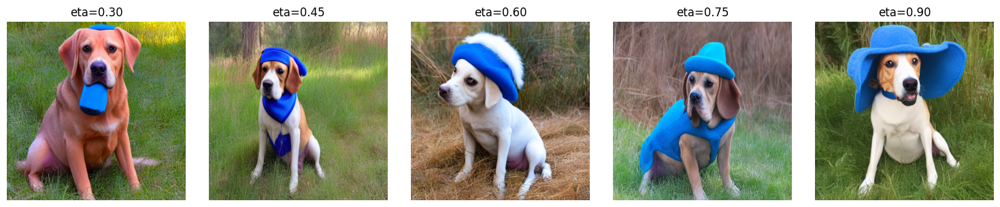


--- Génération de séquence terminée ---


In [11]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.2072: 100%|██████████| 25/25 [00:49<00:00,  1.99s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0938: 100%|██████████| 50/50 [04:58<00:00,  5.96s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:09<00:00,  1.62it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:15<01:03, 15.91s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:09<00:00,  1.62it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:31<00:47, 16.00s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:09<00:00,  1.62it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:48<00:32, 16.04s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:09<00:00,  1.61it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:04<00:16, 16.04s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:09<00:00,  1.62it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:19<00:00, 15.99s/it]


GIF sauvegardé dans ./output/sequence.gif


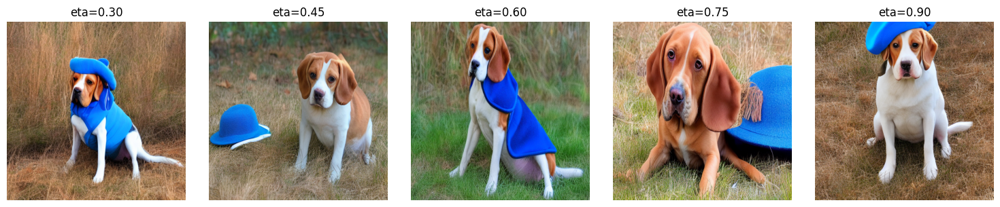


--- Génération de séquence terminée ---


In [12]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.0519: 100%|██████████| 25/25 [00:50<00:00,  2.00s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.6746: 100%|██████████| 50/50 [05:16<00:00,  6.33s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:26<01:44, 26.09s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:16<00:00,  1.13s/it]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:52<01:18, 26.20s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [01:18<00:52, 26.29s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:17<00:00,  1.14s/it]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:44<00:26, 26.26s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:17<00:00,  1.15s/it]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [02:11<00:00, 26.34s/it]


GIF sauvegardé dans ./output/sequence.gif


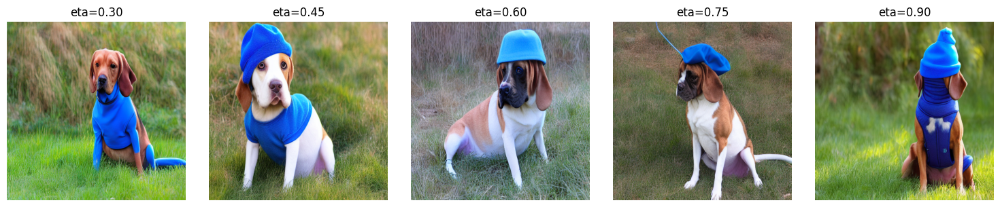


--- Génération de séquence terminée ---


In [13]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.0811: 100%|██████████| 25/25 [00:50<00:00,  2.02s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0503: 100%|██████████| 50/50 [03:55<00:00,  4.71s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.75it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:15<01:02, 15.56s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:31<00:46, 15.51s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:46<00:30, 15.49s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.74it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:02<00:15, 15.50s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.74it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:17<00:00, 15.49s/it]


GIF sauvegardé dans ./output/sequence.gif


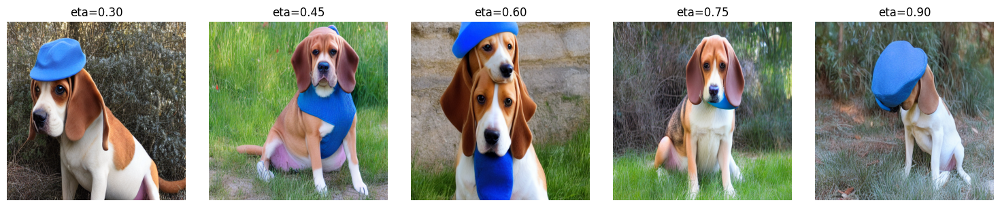


--- Génération de séquence terminée ---


In [14]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.4274: 100%|██████████| 25/25 [00:57<00:00,  2.29s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0086: 100%|██████████| 50/50 [04:21<00:00,  5.24s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.41it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:18<01:15, 18.97s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.40it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:37<00:56, 18.96s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.41it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:56<00:37, 18.91s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.41it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:15<00:18, 18.90s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.42it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:34<00:00, 18.90s/it]


GIF sauvegardé dans ./output/sequence.gif


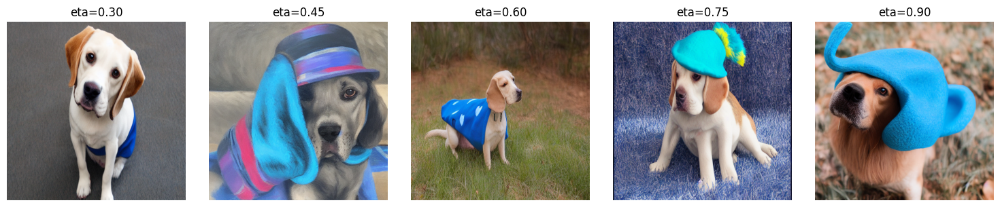


--- Génération de séquence terminée ---


In [15]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.4268: 100%|██████████| 25/25 [00:43<00:00,  1.74s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0229: 100%|██████████| 50/50 [03:20<00:00,  4.01s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:07<00:00,  1.95it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:15<01:02, 15.52s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:07<00:00,  1.95it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:31<00:46, 15.52s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:07<00:00,  1.96it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:46<00:30, 15.47s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:07<00:00,  1.96it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:01<00:15, 15.50s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:07<00:00,  1.95it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:17<00:00, 15.48s/it]


GIF sauvegardé dans ./output/sequence.gif


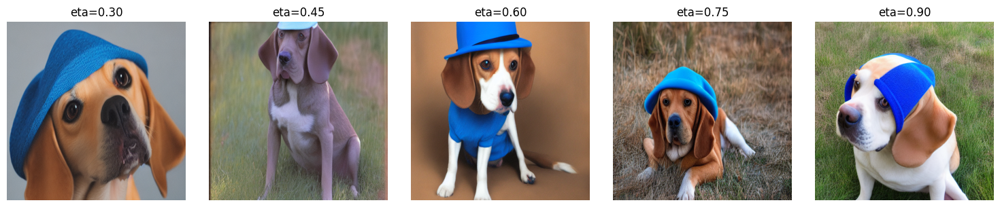


--- Génération de séquence terminée ---


In [16]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.6707: 100%|██████████| 25/25 [01:11<00:00,  2.84s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0170: 100%|██████████| 50/50 [03:41<00:00,  4.43s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.74it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:16<01:06, 16.57s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.75it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:33<00:49, 16.58s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.77it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:49<00:33, 16.53s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.74it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:06<00:16, 16.59s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.74it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:22<00:00, 16.59s/it]


GIF sauvegardé dans ./output/sequence.gif


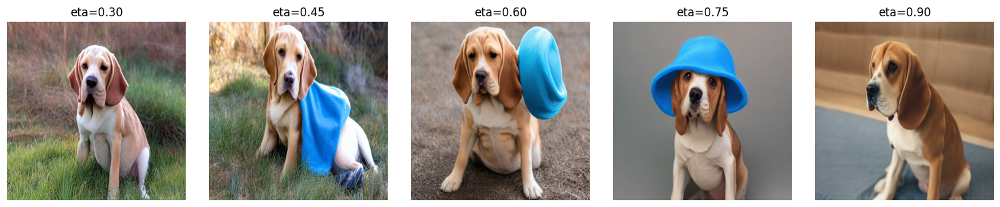


--- Génération de séquence terminée ---


In [17]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.1064: 100%|██████████| 25/25 [00:45<00:00,  1.84s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.1781: 100%|██████████| 50/50 [03:08<00:00,  3.77s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.43it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:17<01:09, 17.33s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.43it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:34<00:51, 17.30s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.45it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:51<00:34, 17.25s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.44it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:09<00:17, 17.25s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.45it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:26<00:00, 17.24s/it]


GIF sauvegardé dans ./output/sequence.gif


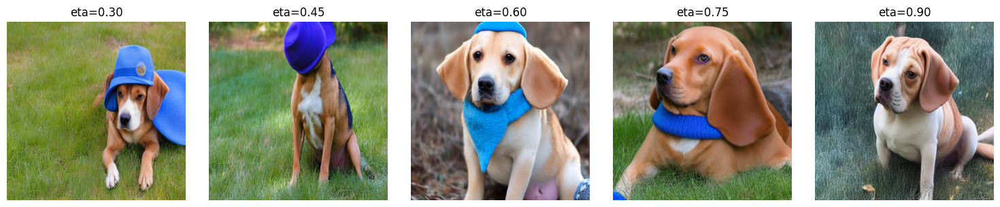


--- Génération de séquence terminée ---


In [18]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.3814: 100%|██████████| 25/25 [01:03<00:00,  2.52s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.2349: 100%|██████████| 50/50 [03:15<00:00,  3.90s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:11<00:00,  1.35it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:18<01:13, 18.42s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:11<00:00,  1.36it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:36<00:55, 18.35s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:11<00:00,  1.35it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:55<00:36, 18.34s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.36it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:13<00:18, 18.30s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:10<00:00,  1.37it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:31<00:00, 18.31s/it]


GIF sauvegardé dans ./output/sequence.gif


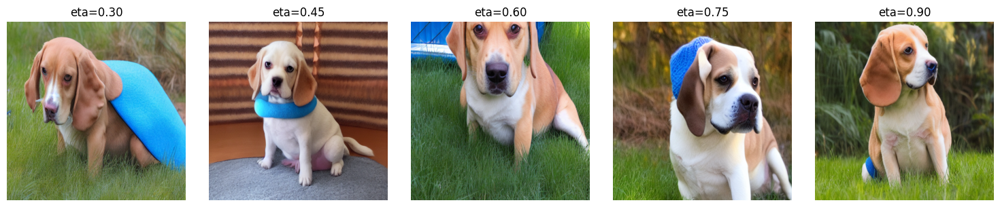


--- Génération de séquence terminée ---


In [19]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.0482: 100%|██████████| 25/25 [00:51<00:00,  2.08s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0317: 100%|██████████| 50/50 [02:56<00:00,  3.53s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:14<00:59, 14.80s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:29<00:44, 14.81s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:44<00:29, 14.80s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [00:59<00:14, 14.80s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:13<00:00, 14.80s/it]


GIF sauvegardé dans ./output/sequence.gif


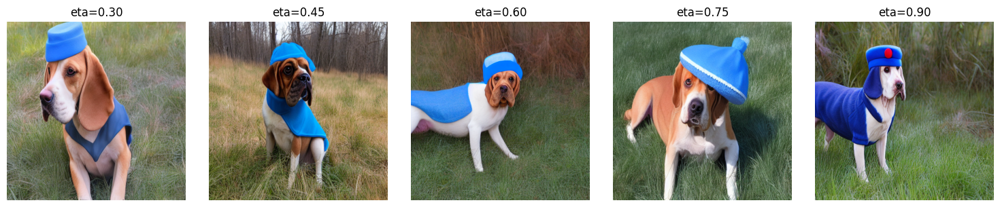


--- Génération de séquence terminée ---


In [20]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.0101: 100%|██████████| 25/25 [00:57<00:00,  2.31s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.4097: 100%|██████████| 50/50 [04:28<00:00,  5.37s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:20<00:00,  1.36s/it]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:27<01:50, 27.68s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:19<00:00,  1.31s/it]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:54<01:21, 27.20s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:19<00:00,  1.32s/it]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [01:21<00:54, 27.11s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:20<00:00,  1.34s/it]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:48<00:27, 27.19s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:20<00:00,  1.35s/it]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [02:16<00:00, 27.27s/it]


GIF sauvegardé dans ./output/sequence.gif


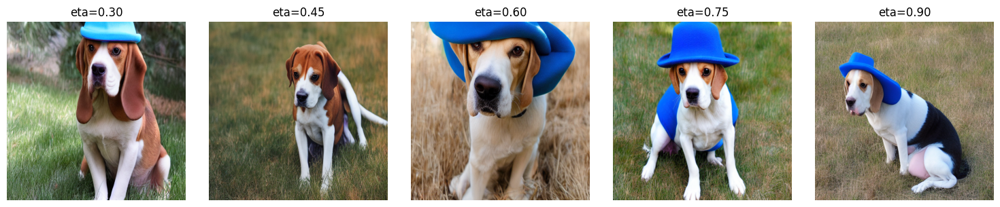


--- Génération de séquence terminée ---


In [21]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()


--- Initialisation pour Génération de Séquence ---
Tentative de chargement des composants pour 'stable-diffusion-v1-5/stable-diffusion-v1-5'...
Composants chargés avec succès!

--- Démarrage de la génération de séquence ---

--- Génération d'une séquence de 5 images ---

--- Étape A: Optimisation de l'embedding pour 'A dog with a blue hat' ---


Optimisation embedding - Loss: 0.1995: 100%|██████████| 25/25 [00:38<00:00,  1.55s/it]


--- Fin Étape A ---

--- Étape B: Fine-tuning de l'UNet ---


Fine-tuning UNet - Loss: 0.0046: 100%|██████████| 50/50 [03:05<00:00,  3.71s/it]


--- Fin Étape B ---


Génération de séquence:   0%|          | 0/5 [00:00<?, ?it/s]

Frame 1/5, eta=0.30

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:11<00:00,  1.31it/s]


--- Fin Étape C ---


Génération de séquence:  20%|██        | 1/5 [00:18<01:12, 18.12s/it]

Frame 2/5, eta=0.45

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:11<00:00,  1.31it/s]


--- Fin Étape C ---


Génération de séquence:  40%|████      | 2/5 [00:36<00:54, 18.11s/it]

Frame 3/5, eta=0.60

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:11<00:00,  1.32it/s]


--- Fin Étape C ---


Génération de séquence:  60%|██████    | 3/5 [00:54<00:36, 18.10s/it]

Frame 4/5, eta=0.75

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:11<00:00,  1.31it/s]


--- Fin Étape C ---


Génération de séquence:  80%|████████  | 4/5 [01:12<00:18, 18.08s/it]

Frame 5/5, eta=0.90

--- Étape C: Génération ---
Processeurs d'attention enregistrés pour 16 couches de cross-attention via assignation directe.


Génération: 100%|██████████| 15/15 [00:11<00:00,  1.31it/s]


--- Fin Étape C ---


Génération de séquence: 100%|██████████| 5/5 [01:30<00:00, 18.09s/it]


GIF sauvegardé dans ./output/sequence.gif


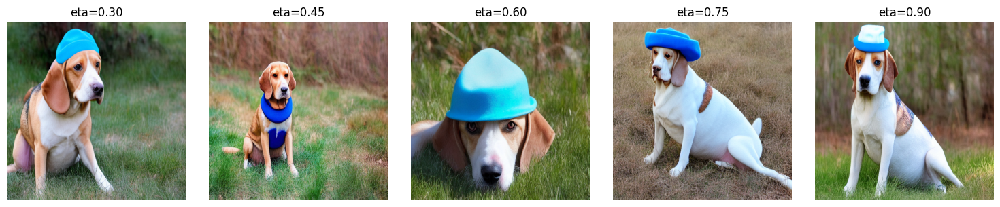


--- Génération de séquence terminée ---


In [22]:
if __name__ == "__main__":
    # --- Test de la génération de séquence (optionnel) ---
    print("\n--- Initialisation pour Génération de Séquence ---")
    try:
        # Vous pouvez utiliser le même modèle ou un autre
        MODEL_ID_OR_PATH = "stable-diffusion-v1-5/stable-diffusion-v1-5"
        INPUT_IMAGE_PATH = "/home/antoine/genai_project/assets/dog.jpg"
        TARGET_TEXT = "A dog with a blue hat"
        seq_gen = ImageSequenceGenerator(model_id_or_path=MODEL_ID_OR_PATH, verbose=True)
    
        print("\n--- Démarrage de la génération de séquence ---")
        sequence_images = seq_gen.generate_sequence(
            input_image=INPUT_IMAGE_PATH,
            target_text=TARGET_TEXT,
            num_frames=5,     # Nombre d'images dans le GIF/séquence
            start_eta=0.3,    # eta de départ pour l'interpolation
            end_eta=0.9,      # eta de fin
            steps_a=25,       # Peut-être réduire pour accélérer la séquence
            steps_b=50,      # Peut-être réduire pour accélérer la séquence
            inference_steps=15 # Peut-être réduire pour accélérer la séquence
        )
        print("\n--- Génération de séquence terminée ---")
    
    except Exception as e:
        print(f"\n!!! ERREUR lors de la génération de séquence: {e} !!!")
        import traceback
        traceback.print_exc()